# Automobile insurance predictions

Objectives : The goal here is to give an approach on the automobile insurance Kaggle problem (https://www.kaggle.com/c/auto-insurance-fall-2017/overview).


#### Importing packages

In [192]:
import numpy as np
import pandas as pd
import pandas_profiling as pp
from sklearn.datasets import load_iris
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import plot_tree
from matplotlib import pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

#### Importing datas

In [289]:
train_df = pd.read_csv('train_auto.csv')
test_df = pd.read_csv('test_auto.csv')
mean_df = pd.read_csv('MEAN_AUTO.csv')

## Preprocessing datas

Dropping useless features

In [290]:
train_df.drop(['INDEX', 'TARGET_AMT'] , axis=1, inplace=True)
test_df.drop(['INDEX', 'TARGET_AMT'] , axis=1, inplace=True)

Dropping the '$', and setting as float for amount colums

In [291]:
dollars_list = ['INCOME', 'HOME_VAL', 'BLUEBOOK', 'OLDCLAIM']
for col in dollars_list:
    train_df.loc[:,col] = train_df[col].str.split('$').str.get(1)
    train_df.loc[:,col] = train_df.loc[:,col].str.replace(',', '.')
    train_df.loc[:,col] = train_df[col].astype(float)
    test_df.loc[:,col] = test_df[col].str.split('$').str.get(1)
    test_df.loc[:,col] = test_df.loc[:,col].str.replace(',', '.')
    test_df.loc[:,col] = test_df[col].astype(float)

Getting a glimpse at the dataset

In [274]:
profile_train = pp.ProfileReport(train_df, title="Pandas Profiling Report")
profile_train

The percentage of missing values is around 5-6 % for 5 columns in the dataset (24 variables). In total it represents 1.2% of missing cells in the entire dataset.

In [292]:
# Dropping NAn's
train_df = train_df.dropna()
test_df.drop(columns=['TARGET_FLAG'], inplace=True)
test_df = test_df.dropna(subset=test_df.columns)
# resetting index
train_df.reset_index(drop=True, inplace=True)
test_df.reset_index(drop=True, inplace=True)

Dummifying categorical features

In [293]:
# Replacing yes-no columns to 1-0 columns 
train_df['MSTATUS'].replace('Yes', 1, inplace=True)
train_df['MSTATUS'].replace('z_No', 0, inplace=True)
train_df['PARENT1'].replace('Yes', 1, inplace=True)
train_df['PARENT1'].replace('No', 0, inplace=True)
train_df['SEX'].replace('z_F', 1, inplace=True)
train_df['SEX'].replace('M', 0, inplace=True)
train_df['RED_CAR'].replace('yes', 1, inplace=True)
train_df['RED_CAR'].replace('no', 0, inplace=True)
train_df['REVOKED'].replace('Yes', 1, inplace=True)
train_df['REVOKED'].replace('No', 0, inplace=True)

test_df['MSTATUS'].replace('Yes', 1, inplace=True)
test_df['MSTATUS'].replace('z_No', 0, inplace=True)
test_df['PARENT1'].replace('Yes', 1, inplace=True)
test_df['PARENT1'].replace('No', 0, inplace=True)
test_df['SEX'].replace('z_F', 1, inplace=True)
test_df['SEX'].replace('M', 0, inplace=True)
test_df['RED_CAR'].replace('yes', 1, inplace=True)
test_df['RED_CAR'].replace('no', 0, inplace=True)
test_df['REVOKED'].replace('Yes', 1, inplace=True)
test_df['REVOKED'].replace('No', 0, inplace=True)

# dummifying categorical columns:

train_df = pd.get_dummies(train_df, columns=['CAR_TYPE', 'URBANICITY', 'CAR_USE', 'JOB', 'EDUCATION'])
test_df = pd.get_dummies(test_df, columns=['CAR_TYPE', 'URBANICITY', 'CAR_USE', 'JOB', 'EDUCATION'])

## Modelisation

We are going to apply 3 ML methods :
* Logistic regression
* Decision tree
* XGBoost classifier



For each methods we will use :
* Evaluation metric : AUC score (and ROC curve)
* Cross validation : 5-fold stratified
* Hyperparameter optimization : Grid Search or Random Search

Setting the matrix X and the target y

In [86]:
X = train_df.drop(['TARGET_FLAG'], axis=1)
y = train_df['TARGET_FLAG']

### 1 - Logistic regression

Preparing data for logistic regression

In [296]:
# dropping one of each group of dummies to have full rank matrices
X.drop(columns=['EDUCATION_<High School', 'URBANICITY_z_Highly Rural/ Rural',
                'CAR_TYPE_Panel Truck', 'CAR_USE_Commercial', 'JOB_Doctor'], inplace=True)
# Scaling features to 0-1 range
X_minmax = MinMaxScaler().fit_transform(X)

Defining classifier

In [297]:
clf1 = LogisticRegression()

Hyperparameter space :

In [300]:
param_space1 = {'C': np.logspace(-3,3,7), 
               'penalty' :['l1','l2'],# l1 lasso l2 ridge
                'solver': ['liblinear'],
               'random_state': [0]}

Grid search with 5-folds cross_validation for each trial


In [301]:
grid_search_logr = GridSearchCV(estimator=clf1,
                     param_grid=param_space1,
                     scoring='roc_auc',
                     cv=5)
# running search
grid_search_logr.fit(X_minmax, y.values)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2'], 'random_state': [0],
                         'solver': ['liblinear']},
             scoring='roc_auc')

Getting best auc and corresponding hyperparameters set

In [302]:
best_parameters1 = grid_search_logr.best_params_
best_auc1 = grid_search_logr.best_score_
print('best parameters: ' + str(best_parameters1))
print('best auc: ' + str(best_auc1))

best parameters: {'C': 1.0, 'penalty': 'l2', 'random_state': 0, 'solver': 'liblinear'}
best auc: 0.8098905219017993


Running classifier with obtained best hyperparameters set

In [304]:
clf1.set_params(** best_parameters1)
clf1.fit(X_minmax,y)

LogisticRegression(random_state=0, solver='liblinear')

Creating features importance dictionary to plot with corresponding names

In [305]:
importance_coef = clf1.coef_
importance_dict = dict(zip(X.columns, importance_coef[0]))
importance_dict = dict(sorted(importance_dict.items(), key=lambda item: item[1], reverse=True))
importance_list = list(importance_dict.items())[0:10]

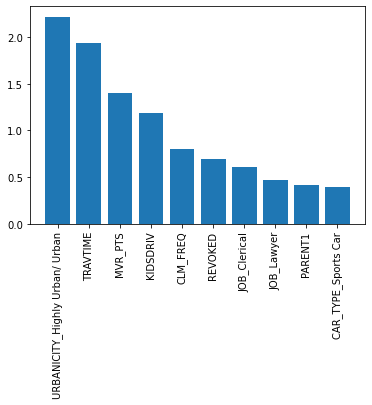

In [306]:
# plotting features importance
features = [tupl[0] for tupl in importance_list]
importance = [tupl[1] for tupl in importance_list]
plt.bar(features, importance)
plt.xticks(rotation=90)
plt.show()

Auc > 0.8 hence the classification is very good and we can interpret the results with features importance, the model coefficients...

### 2 - Decision tree

Defining classifier

In [242]:
clf2 = DecisionTreeClassifier()

Hyperparameter space :

In [246]:
param_space2 = {'max_depth': list(range(2,10,1)),
               'min_samples_split':list(np.linspace(0.1, 1.0, 10, endpoint=True)),
               'max_features': list(range(6, X.shape[1])),
               'random_state': [0]}

Grid search with 5-folds cross_validation for each trial


In [247]:
grid_search_dtree = GridSearchCV(estimator=clf2,
                     param_grid=param_space2,
                     scoring='roc_auc',
                     cv=5)
# running search
grid_search_dtree.fit(X, y)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': [2, 3, 4, 5, 6, 7, 8, 9],
                         'max_features': [6, 7, 8, 9, 10, 11, 12, 13, 14, 15,
                                          16, 17, 18, 19, 20, 21, 22, 23, 24,
                                          25, 26, 27, 28, 29, 30, 31, 32, 33,
                                          34, 35, ...],
                         'min_samples_split': [0.1, 0.2, 0.30000000000000004,
                                               0.4, 0.5, 0.6,
                                               0.7000000000000001, 0.8, 0.9,
                                               1.0],
                         'random_state': [0]},
             scoring='roc_auc')

Getting best auc and corresponding hyperparameters set

In [332]:
best_parameters2 = grid_search_dtree.best_params_
best_auc2 = grid_search_dtree.best_score_
print('best parameters: ' + str(best_parameters2))
print('best auc: ' + str(best_auc2))

best parameters: {'max_depth': 9, 'max_features': 12, 'min_samples_split': 0.1, 'random_state': 0}
best auc: 0.7633457300179927


Running classifier with obtained best hyperparameters set

In [333]:
clf2.set_params(** best_parameters2)
clf2.fit(X,y)

DecisionTreeClassifier(max_depth=9, max_features=12, min_samples_split=0.1,
                       random_state=0)

Plotting tree with the best hyperparameter

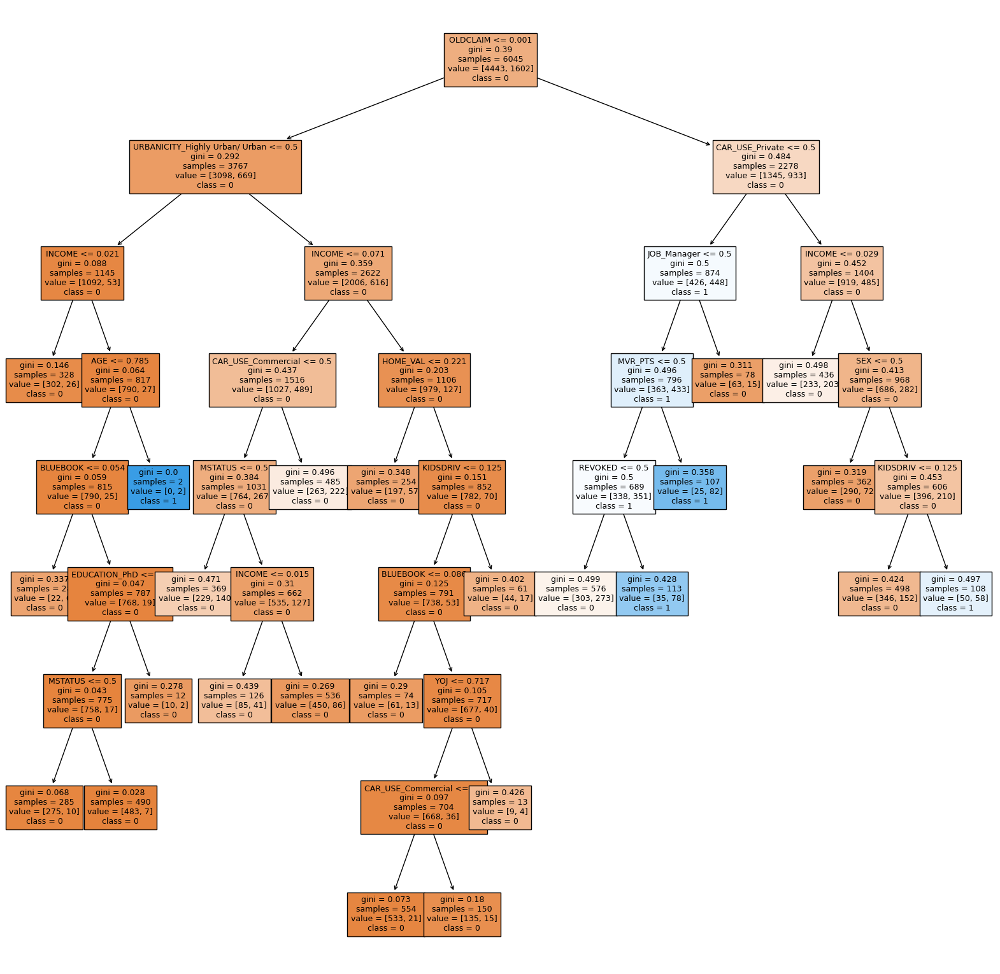

In [251]:
fig, axes = plt.subplots(figsize = (20,20), dpi=100)
tree.plot_tree(clf2, 
               feature_names=X.columns,  
               class_names=['0','1'],
               filled=True,
               fontsize = 9)

plt.show()

The obtained tree is easy to read and auc > 0.7 hence the classification is good. However we can try to reach higher performance with a boosting method:

 ### 3 - XGBoost

Defining classifier

In [153]:
clf3 = XGBClassifier()

Hyperparameter space :

In [337]:
param_space3 ={'n_estimators': [25, 50, 100, 200],
               'learning_rate': [.01, .05, .1, 0.5, 0.7, 1],
               'max_depth': [2, 3, 5, 7],
               'colsample_bytree': [0.3, 0.4, 0.5],
               'reg_alpha': [0.1, 0.5, 1, 2, 4],
               'reg_lambda': [0.1, 0.5, 1, 2, 4],
               'min_child_weight': [1, 3, 5],
               'subsample': [.5, .6, .7, .8, .9],
               'random_state': [0]}

Random search search with 5-folds cross_validation for each trial (we can't here use a grid search due to the too large hyperparameters space)

In [338]:
random_search = RandomizedSearchCV(estimator=clf3,
                                   param_distributions=param_space3,
                                   n_iter=50,
                                   scoring='roc_auc',
                                   cv=5)
# running search
random_search.fit(X.values, y.values)

RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           n_estimators=100,...
                                           validate_parameters=None,
                                           verbosity=None),
                   n_iter=50,
                   par

Getting best auc and corresponding hyperparameters set

In [339]:
best_parameters3 = random_search.best_params_
best_auc3 = random_search.best_score_
print('best parameters: ' + str(best_parameters3))
print('best auc: ' + str(best_auc3))

best parameters: {'subsample': 0.8, 'reg_lambda': 0.5, 'reg_alpha': 0.1, 'random_state': 0, 'n_estimators': 200, 'min_child_weight': 3, 'max_depth': 5, 'learning_rate': 0.05, 'colsample_bytree': 0.3}
best auc: 0.824768238567773


Running classifier with obtained best hyperparameters set

In [340]:
clf3.set_params(** best_parameters3)
clf3.fit(X.values,y.values)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.3, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.05, max_delta_step=0, max_depth=5,
              min_child_weight=3, missing=nan, monotone_constraints='()',
              n_estimators=200, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0.1, reg_lambda=0.5, scale_pos_weight=1, subsample=0.8,
              tree_method='exact', validate_parameters=1, verbosity=None)

#### Best performance is of course given by the boosting method (xgboost). The logistic regression also give a good score and is easier to interpret.

## Applying to test datas and saving

Logistic regression

In [310]:
# dropping one of each group of dummies to have full rank matrices
test_df.drop(columns=['EDUCATION_<High School', 'URBANICITY_z_Highly Rural/ Rural',
                'CAR_TYPE_Panel Truck', 'CAR_USE_Commercial', 'JOB_Doctor'], inplace=True)
# Scaling features to 0-1 range
X_minmax = MinMaxScaler().fit_transform(test_df)

In [328]:
pred_logr = clf1.predict_proba(test_df)[:,1]

Decision tree

In [323]:
pred_dt = clf2.predict_proba(test_df)[:,1]

XGBoost

In [346]:
pred_xgb = clf3.predict_proba(test_df.values)[:,1]

Saving in csv file:

In [352]:
# creatng results dataframe
results = pd.DataFrame({'Logistic regression': pred_logr,
                        'Decision tree': pred_dt,
                        'XGBoost': pred_xgb})
results.to_csv('auto_insu_predictions.csv')